In [12]:
import numpy as np # linear algebra
import pandas as pd # data processing


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_12723.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_13601.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_1068.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_16385.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_3016.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_15715.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_19044.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_18989.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_8983.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_11540.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_4215.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_15619.jpg
/kaggle/input/deepfake-and-real-images/Dataset/Validation/Fake/fake_

# Import Libraries

In [13]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader, random_split
import time
import copy
import os


# Set Device


In [14]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Data Preparation and Augmentation

In [19]:
# Define transforms for training and validation
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ]),
}

# Split the dataset : 80% for training, 20% for validation

In [20]:
# Path to the dataset with subdirectories "fake" and "real"
dataset_path = '/kaggle/input/deepfake-and-real-images/Dataset/Test'  # Update this path
full_dataset = datasets.ImageFolder(root=dataset_path, transform=data_transforms['train'])


train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size])

# Set the validation transform for the validation dataset
val_dataset.dataset.transform = data_transforms['val']

# Create dataloaders
batch_size = 32
dataloaders = {
    'train': DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4),
    'val': DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
}

dataset_sizes = {'train': len(train_dataset), 'val': len(val_dataset)}
class_names = full_dataset.classes  # Expected to be ['fake', 'real']
print("Classes:", class_names)


Classes: ['Fake', 'Real']


# Load the pretrained ResNet18 model

In [21]:
model_ft = models.resnet18(pretrained=True)
num_ftrs = model_ft.fc.in_features

# Modify the final layer for binary classification (fake vs. real)
model_ft.fc = nn.Linear(num_ftrs, 2)
model_ft = model_ft.to(device)


# Loss Function, Optimizer, and Learning Rate Scheduler
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_ft.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 175MB/s]


# Model training

In [22]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    
    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-'*10)
        
        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()   # Set model to training mode
            else:
                model.eval()    # Set model to evaluation mode
            
            running_loss = 0.0
            running_corrects = 0
            
            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)
                
                optimizer.zero_grad()
                
                # Forward pass
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)
                    
                    # Backward pass and optimize only in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            
            if phase == 'train':
                scheduler.step()
            
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            
            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
            
            # Deep copy the model if validation accuracy improved
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
        print()
    
    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed//60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best validation Acc: {best_acc:.4f}')
    
    # Load best model weights
    model.load_state_dict(best_model_wts)
    return model

num_epochs = 5  
model_ft = train_model(model_ft, criterion, optimizer, scheduler, num_epochs=num_epochs)

Epoch 1/5
----------
train Loss: 0.3216 Acc: 0.8633
val Loss: 0.2641 Acc: 0.9019

Epoch 2/5
----------
train Loss: 0.1689 Acc: 0.9321
val Loss: 0.2532 Acc: 0.9019

Epoch 3/5
----------
train Loss: 0.1281 Acc: 0.9493
val Loss: 0.1643 Acc: 0.9413

Epoch 4/5
----------
train Loss: 0.1066 Acc: 0.9586
val Loss: 0.1620 Acc: 0.9477

Epoch 5/5
----------
train Loss: 0.0882 Acc: 0.9684
val Loss: 0.1606 Acc: 0.9418

Training complete in 2m 50s
Best validation Acc: 0.9477


# Save the model

In [24]:
# Save the trained model
torch.save(model_ft.state_dict(), 'deepfake_resnet18.pth')
print("Model saved as deepfake_resnet18.pth")

Model saved as deepfake_resnet18.pth


# Confusion matrix

Class Names: ['Fake', 'Real']


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
<ipython-input-25-8f47e5ac5719>:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more detai

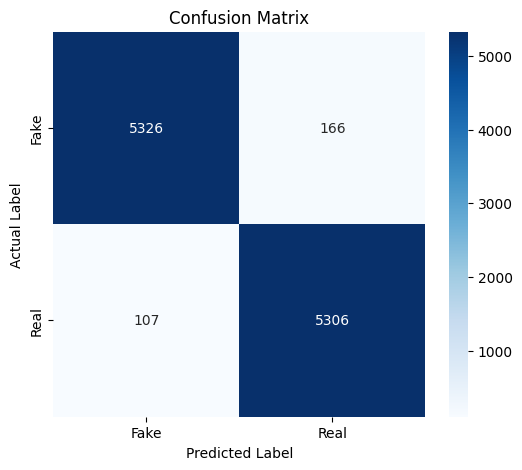

Classification Report:
               precision    recall  f1-score   support

        Fake       0.98      0.97      0.98      5492
        Real       0.97      0.98      0.97      5413

    accuracy                           0.97     10905
   macro avg       0.97      0.98      0.97     10905
weighted avg       0.98      0.97      0.97     10905



In [25]:
import torch
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from torchvision import datasets, transforms, models
import torch.nn as nn
from tqdm import tqdm

# Set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


# Define Transformations

val_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# Load the Model

def load_model(checkpoint_path, num_classes=2):
    model = models.resnet18(pretrained=True)
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, num_classes)
    
    # Load trained weights
    model.load_state_dict(torch.load(checkpoint_path, map_location=device))
    model.to(device)
    model.eval()
    return model


# Load Test Dataset
test_dir = "/kaggle/input/deepfake-and-real-images/Dataset/Test"  # Update with actual test set path

# Load dataset
test_dataset = datasets.ImageFolder(root=test_dir, transform=val_transform)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=False)

# Get class names ( ['fake', 'real'])
class_names = test_dataset.classes
print("Class Names:", class_names)


# Generate Predictions
def evaluate_model(model, dataloader):
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Evaluating Model"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())  # Convert tensors to numpy
            all_labels.extend(labels.cpu().numpy())

    return np.array(all_labels), np.array(all_preds)

# Load model
checkpoint_path = "/kaggle/working/deepfake_resnet18.pth"  # Update with actual path
model = load_model(checkpoint_path, num_classes=len(class_names))

# Get predictions and actual labels
y_true, y_pred = evaluate_model(model, test_loader)


# Compute and Plot Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

# Plot Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title("Confusion Matrix")
plt.show()

# Print Classification Report
print("Classification Report:\n", classification_report(y_true, y_pred, target_names=class_names))


# Random prediction for some images in the dataset

Classes found: ['Fake', 'Real']


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
<ipython-input-26-7f10971324c9>:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more detai

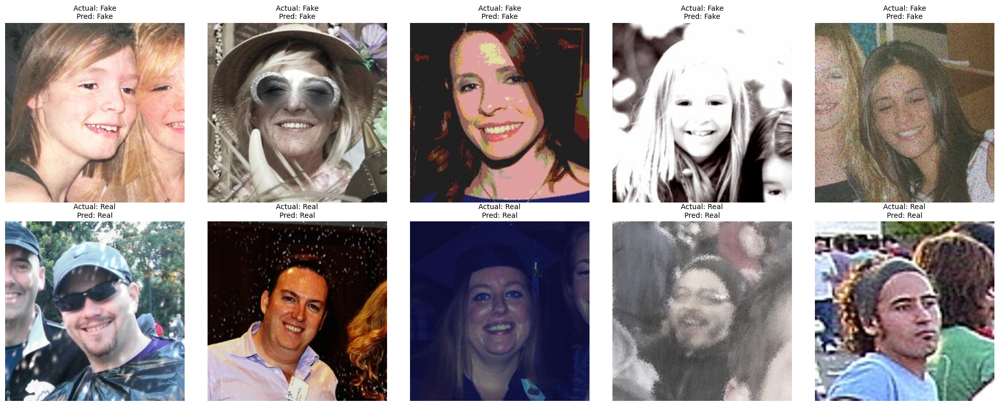

In [26]:
import torch
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms, models
import torch.nn as nn

# Set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


# Define the Transformation
val_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# Load the Trained Model

def load_deepfake_model(checkpoint_path, num_classes=2):
    # Load a pretrained ResNet18 model
    model = models.resnet18(pretrained=True)
    num_ftrs = model.fc.in_features
    # Modify the final layer for binary classification (fake vs. real)
    model.fc = nn.Linear(num_ftrs, num_classes)
    
    # Load the trained weights
    model.load_state_dict(torch.load(checkpoint_path, map_location=device))
    model.to(device)
    model.eval()
    return model


# Prediction and Plotting Function
def predict_and_plot(ax, model, image_path, class_names, transform):
    """
    Loads an image from image_path, applies the transform, predicts the label,
    extracts the actual label from its folder name, and plots the image with
    a title showing both the actual and predicted labels.
    """
    # Load image and convert to RGB
    image = Image.open(image_path).convert('RGB')
    
    # Prepare the image for prediction
    image_tensor = transform(image).to(device).unsqueeze(0)
    
    # Make prediction
    with torch.no_grad():
        outputs = model(image_tensor)
        _, pred = torch.max(outputs, 1)
    predicted_label = class_names[pred.item()]
    
    # Extract actual label from the folder name (expects .../<label>/image.jpg)
    actual_label = os.path.basename(os.path.dirname(image_path))
    
    # Plot the image with title showing both labels
    ax.imshow(image)
    ax.set_title(f"Actual: {actual_label}\nPred: {predicted_label}", fontsize=10)
    ax.axis('off')

# Select Images from the Dataset

# Path to dataset 
dataset_path = '/kaggle/input/deepfake-and-real-images/Dataset/Test'

# Get class names from subdirectories and sort for consistency
classes = sorted([d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))])
print("Classes found:", classes)

# For each class, randomly select 5 images
selected_images = {}
for cls in classes:
    cls_folder = os.path.join(dataset_path, cls)
    image_files = [os.path.join(cls_folder, f) for f in os.listdir(cls_folder)
                   if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    # If fewer than 5 images, take all; otherwise, randomly select 5
    selected_images[cls] = random.sample(image_files, 5) if len(image_files) >= 5 else image_files


# Load the Model

# Path to the saved model checkpoint 
checkpoint_path = '/kaggle/input/deep-fake-image/keras/default/1/deepfake_resnet18.pth'

model = load_deepfake_model(checkpoint_path, num_classes=len(classes))


# Plot the Predictions in a Grid

# We want 5 images horizontally; if we have 2 classes, this will create a 2x5 grid.
num_rows = len(selected_images)      # one row per class
num_cols = 5                         # 5 images per class

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, num_rows * 4))

# If only one row exists, wrap axes in a list for consistency
if num_rows == 1:
    axes = [axes]

# Loop over each class and its images to predict and plot
row = 0
for cls, images in selected_images.items():
    for col in range(num_cols):
        if col < len(images):
            predict_and_plot(axes[row][col], model, images[col], classes, val_transform)
        else:
            axes[row][col].axis('off')  # Hide axis if fewer than 5 images are available
    row += 1

plt.tight_layout()
plt.show()
